In [3]:
import warnings
warnings.filterwarnings('ignore')

import skmob
from skmob.preprocessing import filtering
from skmob.preprocessing import compression
import geopandas as gpd
from skmob.utils import plot
import folium
from folium import plugins
import pandas as pd
from folium.plugins import HeatMap
import matplotlib.pyplot as plt
from stats_utils import *
from skmob.utils.plot import *
from skmob.data.load import *
import geopandas as gpd
import os

## Leggiamo dataset di movimenti (cellulari) e creiamo un dataset di movimenti intercomunali pulito 

In [4]:
directory_path = '/Users/Andre/Desktop/internship/zonizzazione_shp'
file_name = 'mat_OD_irpet.xlsx'  
movements_df = pd.read_excel(os.path.join(directory_path, file_name))

In [5]:
movements_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 672223 entries, 0 to 672222
Data columns (total 5 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   StartId     672223 non-null  int64  
 1   EndId       672223 non-null  int64  
 2   PartOfWeek  672223 non-null  object 
 3   Mot         672223 non-null  object 
 4   tot         672223 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 25.6+ MB


In [6]:
movements_df.tail()

,StartId,EndId,PartOfWeek,Mot,tot
672218,100007000,100007000,Saturday,Road,475.88
672219,100007000,100007000,Saturday,SlowModes,140.31
672220,100007000,100007000,Sunday,Bus,1.28
672221,100007000,100007000,Sunday,Road,417.13
672222,100007000,100007000,Sunday,SlowModes,74.11


In [7]:
zone_pulite=gpd.read_file('ZonePulite.geojson', driver='GeoJSON')

In [8]:
lista_zone=(zone_pulite['NO'].unique()).tolist()

In [9]:
##prendiamo solo i movimenti che sono interni alle zone del geodataframe di zonizzazione iniziale
movements_tos = movements_df[(movements_df["StartId"].isin(lista_zone))&(movements_df["EndId"].isin(lista_zone))]
print(movements_tos)

          StartId      EndId PartOfWeek        Mot      tot
0               1          1    Mon-Fri        Bus   640.61
1               1          1    Mon-Fri       Road   228.45
2               1          1    Mon-Fri  SlowModes  5527.05
3               1          1   Saturday        Bus   963.81
4               1          1   Saturday       Road   333.20
...           ...        ...        ...        ...      ...
672218  100007000  100007000   Saturday       Road   475.88
672219  100007000  100007000   Saturday  SlowModes   140.31
672220  100007000  100007000     Sunday        Bus     1.28
672221  100007000  100007000     Sunday       Road   417.13
672222  100007000  100007000     Sunday  SlowModes    74.11

[587707 rows x 5 columns]


In [10]:
print(movements_df)

          StartId      EndId PartOfWeek        Mot      tot
0               1          1    Mon-Fri        Bus   640.61
1               1          1    Mon-Fri       Road   228.45
2               1          1    Mon-Fri  SlowModes  5527.05
3               1          1   Saturday        Bus   963.81
4               1          1   Saturday       Road   333.20
...           ...        ...        ...        ...      ...
672218  100007000  100007000   Saturday       Road   475.88
672219  100007000  100007000   Saturday  SlowModes   140.31
672220  100007000  100007000     Sunday        Bus     1.28
672221  100007000  100007000     Sunday       Road   417.13
672222  100007000  100007000     Sunday  SlowModes    74.11

[672223 rows x 5 columns]


In [11]:
movements_tos['Mot'].unique()

array(['Bus', 'Road', 'SlowModes', 'Train', 'Tram', 'Plane',
       'NotClassified'], dtype=object)

In [12]:
#Questo codice esegue due merge tra il dataframe movements_tos e il zone_pulite: 
#prima sullo “StartId” per ottenere i dettagli della località di partenza (nome, provincia, geometria), 
#e poi sull'“EndId” per ottenere i dettagli della località di arrivo. 
#Infine, rinomina le colonne per distinguere i campi di partenza/arrivo, elimina quelle superflue e stampa la struttura del dataframe risultante.
movements_with_start = movements_tos.merge(zone_pulite[['NO', 'Nome_Comune','Nome_Provincia','geometry']], left_on='StartId', right_on='NO', how='left')
movements_with_start = movements_with_start.rename(columns={'Nome_Comune': 'Start_Nome_Comune','geometry':'Start_Geometry','Nome_Provincia':'Start_Nome_Provincia'}).drop(columns=['NO'])

movements_with_names = movements_with_start.merge(zone_pulite[['NO', 'Nome_Comune','geometry','Nome_Provincia']], left_on='EndId', right_on='NO', how='left')
movements_with_names = movements_with_names.rename(columns={'Nome_Comune': 'End_Nome_Comune','geometry':'End_Geometry','Nome_Provincia':'End_Nome_Provincia'}).drop(columns=['NO'])

movements_with_names.head(2)


,StartId,EndId,PartOfWeek,Mot,tot,Start_Nome_Comune,Start_Nome_Provincia,Start_Geometry,End_Nome_Comune,End_Geometry,End_Nome_Provincia
0,1,1,Mon-Fri,Bus,640.61,Firenze,Firenze,"POLYGON ((681714.437 4849091.117, 681715.668 4...",Firenze,"POLYGON ((681714.437 4849091.117, 681715.668 4...",Firenze
1,1,1,Mon-Fri,Road,228.45,Firenze,Firenze,"POLYGON ((681714.437 4849091.117, 681715.668 4...",Firenze,"POLYGON ((681714.437 4849091.117, 681715.668 4...",Firenze


In [13]:
movements_with_names.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 587707 entries, 0 to 587706
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   StartId               587707 non-null  int64   
 1   EndId                 587707 non-null  int64   
 2   PartOfWeek            587707 non-null  object  
 3   Mot                   587707 non-null  object  
 4   tot                   587707 non-null  float64 
 5   Start_Nome_Comune     587707 non-null  object  
 6   Start_Nome_Provincia  587707 non-null  object  
 7   Start_Geometry        587707 non-null  geometry
 8   End_Nome_Comune       587707 non-null  object  
 9   End_Geometry          587707 non-null  geometry
 10  End_Nome_Provincia    587707 non-null  object  
dtypes: float64(1), geometry(2), int64(2), object(6)
memory usage: 53.8+ MB


In [15]:
## Creaimo intercomune movements, togliamo cioè i movimenti intracomunali 
intercomune_movements=movements_with_names[movements_with_names['Start_Nome_Comune']!=movements_with_names['End_Nome_Comune']]

In [16]:
intercomune_movements['Start_Nome_Provincia'].unique()

array(['Firenze', 'La Spezia', 'Parma', "Reggio nell'Emilia", 'Bologna',
       'Ravenna', 'ForlÃ¬-Cesena', 'Pesaro e Urbino', 'Massa-Carrara',
       'Lucca', 'Pistoia', 'Livorno', 'Pisa', 'Arezzo', 'Siena',
       'Grosseto', 'Perugia', 'Terni', 'Viterbo', 'Prato'], dtype=object)

In [17]:
tuscany_provinces = ["Firenze","Massa-Carrara",
    "Lucca",
    "Pistoia",
    "Livorno",
    "Pisa",
    "Arezzo",
    "Siena",
    "Grosseto",
    "Prato"]

In [18]:
intercomune_movements=intercomune_movements[
(intercomune_movements['Start_Nome_Provincia'].isin(tuscany_provinces)) &
(intercomune_movements['End_Nome_Provincia'].isin(tuscany_provinces))]

In [19]:
intercomune_movements.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 426748 entries, 1129 to 587697
Data columns (total 11 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   StartId               426748 non-null  int64   
 1   EndId                 426748 non-null  int64   
 2   PartOfWeek            426748 non-null  object  
 3   Mot                   426748 non-null  object  
 4   tot                   426748 non-null  float64 
 5   Start_Nome_Comune     426748 non-null  object  
 6   Start_Nome_Provincia  426748 non-null  object  
 7   Start_Geometry        426748 non-null  geometry
 8   End_Nome_Comune       426748 non-null  object  
 9   End_Geometry          426748 non-null  geometry
 10  End_Nome_Provincia    426748 non-null  object  
dtypes: float64(1), geometry(2), int64(2), object(6)
memory usage: 39.1+ MB


In [20]:
intercomune_movements

,StartId,EndId,PartOfWeek,Mot,tot,Start_Nome_Comune,Start_Nome_Provincia,Start_Geometry,End_Nome_Comune,End_Geometry,End_Nome_Provincia
1129,1,190,Mon-Fri,Road,7.52,Firenze,Firenze,"POLYGON ((681714.437 4849091.117, 681715.668 4...",Scandicci,"POLYGON ((672216.490 4850166.983, 672436.738 4...",Firenze
1130,1,190,Saturday,Road,12.35,Firenze,Firenze,"POLYGON ((681714.437 4849091.117, 681715.668 4...",Scandicci,"POLYGON ((672216.490 4850166.983, 672436.738 4...",Firenze
1131,1,190,Sunday,Road,16.11,Firenze,Firenze,"POLYGON ((681714.437 4849091.117, 681715.668 4...",Scandicci,"POLYGON ((672216.490 4850166.983, 672436.738 4...",Firenze
1132,1,191,Mon-Fri,Road,17.78,Firenze,Firenze,"POLYGON ((681714.437 4849091.117, 681715.668 4...",Scandicci,"POLYGON ((673169.982 4849097.741, 672981.153 4...",Firenze
1133,1,191,Saturday,Road,19.24,Firenze,Firenze,"POLYGON ((681714.437 4849091.117, 681715.668 4...",Scandicci,"POLYGON ((673169.982 4849097.741, 672981.153 4...",Firenze
...,...,...,...,...,...,...,...,...,...,...,...
587693,100007000,100006000,Saturday,Road,607.05,Vernio,Prato,"POLYGON ((675111.482 4880447.744, 674593.485 4...",Vaiano,"POLYGON ((674370.483 4871341.815, 674037.485 4...",Prato
587694,100007000,100006000,Saturday,Train,3.54,Vernio,Prato,"POLYGON ((675111.482 4880447.744, 674593.485 4...",Vaiano,"POLYGON ((674370.483 4871341.815, 674037.485 4...",Prato
587695,100007000,100006000,Sunday,Bus,21.69,Vernio,Prato,"POLYGON ((675111.482 4880447.744, 674593.485 4...",Vaiano,"POLYGON ((674370.483 4871341.815, 674037.485 4...",Prato
587696,100007000,100006000,Sunday,Road,532.65,Vernio,Prato,"POLYGON ((675111.482 4880447.744, 674593.485 4...",Vaiano,"POLYGON ((674370.483 4871341.815, 674037.485 4...",Prato


In [22]:
#Somma movimenti
out_movements_sum = intercomune_movements.groupby('Start_Nome_Comune').agg({'tot': 'sum'}).reset_index()
out_movements_sum = out_movements_sum.rename(columns={'Start_Nome_Comune': 'Nome_Comune', 'tot': 'Out_Movement'})


in_movements_sum = intercomune_movements.groupby('End_Nome_Comune').agg({'tot': 'sum'}).reset_index()
in_movements_sum = in_movements_sum.rename(columns={'End_Nome_Comune': 'Nome_Comune', 'tot': 'In_Movement'})


movements_sum = pd.merge(out_movements_sum, in_movements_sum, on='Nome_Comune', how='outer')


In [23]:
print (movements_sum)

                  Nome_Comune  Out_Movement  In_Movement
0       Abbadia San Salvatore      14123.60     14074.52
1          Abetone Cutigliano       2077.77      1987.78
2                     Agliana      70393.33     70432.64
3                  Altopascio      75278.24     74376.92
4                    Anghiari       4459.68      4290.94
..                        ...           ...          ...
271        Villa Collemandina       4239.66      4139.57
272  Villafranca in Lunigiana       9381.48      9892.71
273                     Vinci      60143.53     59696.68
274                  Volterra      38256.86     39293.98
275                      Zeri       1246.95      1280.65

[276 rows x 3 columns]


In [27]:
tessellation=gpd.read_file("/Users/Andre/Desktop/Internship/TessellationToscana.geojson", driver="GeoJSON")

In [28]:
TotMovements_gdf = tessellation.merge(movements_sum, on='Nome_Comune', how='left')
print(TotMovements_gdf.info())

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 276 entries, 0 to 275
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   COD_COMUNE      276 non-null    float64 
 1   NO              276 non-null    int64   
 2   NAME            276 non-null    object  
 3   Cod_Provincia   276 non-null    float64 
 4   Cod_Regione     276 non-null    float64 
 5   Nome_Comune     276 non-null    object  
 6   Nome_Provincia  276 non-null    object  
 7   Nome_Regione    276 non-null    object  
 8   geometry        276 non-null    geometry
 9   Out_Movement    276 non-null    float64 
 10  In_Movement     276 non-null    float64 
dtypes: float64(5), geometry(1), int64(1), object(4)
memory usage: 25.9+ KB
None


In [30]:
import folium
import branca.colormap as cm


latitude = 43.7696
longitude = 11.2558

map_f = folium.Map(location=[latitude, longitude], zoom_start=8, tiles='CartoDB positron')


colormap = cm.LinearColormap(
    colors=['lightblue', 'yellow', 'orange', 'red'],
    vmin=TotMovements_gdf['Out_Movement'].min(),
    vmax=TotMovements_gdf['Out_Movement'].max()
)


colormap.caption = "Out Movement"
colormap.add_to(map_f)


def movement_style_function(feature):
    out_movement = feature['properties']['Out_Movement']
    color = colormap(out_movement)
    return {
        'fillColor': color,
        'color': 'gray',
        'weight': 0.5,
        'fillOpacity': 0.6,
    }


def region_style_function(feature):
    return{
            'fillColor': 'green',
            'color': 'green',
            'weight': 0.5,
            'fillOpacity': 0.1,
        }
    


folium.GeoJson(
    tessellation,
    style_function=region_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['NAME', 'Nome_Provincia'],
        aliases=['Name:', 'Province:'],
        localize=True
    )
).add_to(map_f)


folium.GeoJson(
    TotMovements_gdf,
    style_function=movement_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Nome_Comune', 'Out_Movement'],
        aliases=['Comune:', 'Out Movement:'],
        localize=True
    )
).add_to(map_f)

map_f


In [32]:
import folium
import branca.colormap as cm


latitude = 43.7696
longitude = 11.2558

map_f = folium.Map(location=[latitude, longitude], zoom_start=8, tiles='CartoDB positron')


colormap = cm.LinearColormap(
    colors=['lightblue', 'yellow', 'orange', 'red'],
    vmin=TotMovements_gdf['In_Movement'].min(),
    vmax=TotMovements_gdf['In_Movement'].max()
)


colormap.caption = "In Movement"
colormap.add_to(map_f)


def movement_style_function(feature):
    out_movement = feature['properties']['In_Movement']
    color = colormap(out_movement)
    return {
        'fillColor': color,
        'color': 'gray',
        'weight': 0.5,
        'fillOpacity': 0.6,
    }


def region_style_function(feature):
        return {
            'fillColor': 'green',
            'color': 'green',
            'weight': 0.5,
            'fillOpacity': 0.1,
        }
   


folium.GeoJson(
    tessellation,
    style_function=region_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['NAME', 'Nome_Provincia'],
        aliases=['Name:', 'Province:'],
        localize=True
    )
).add_to(map_f)


folium.GeoJson(
    TotMovements_gdf,
    style_function=movement_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Nome_Comune', 'In_Movement'],
        aliases=['Comune:', 'In Movement:'],
        localize=True
    )
).add_to(map_f)

map_f


## Creiamo un GeoDataFrame con tutti i movimenti in uscita da ciascun comune

In [ ]:
tessellation=gpd.read_file("/Users/Andre/Desktop/Internship/TessellationToscana.geojson", driver="GeoJSON")

In [33]:
#Se facciamo un groupby per start e end, allora abbiamo quello che ci interessa (movimenti totali da un comune all'altro)
out_movements_summary=intercomune_movements.groupby(['Start_Nome_Comune', 'End_Nome_Comune']).agg({'tot': 'sum'}).reset_index()


out_movements_summary=out_movements_summary.rename(columns={
    'tot': 'Total_Out_Movement',
})


out_movements_summary.head(2)

,Start_Nome_Comune,End_Nome_Comune,Total_Out_Movement
0,Abbadia San Salvatore,Abetone Cutigliano,0.37
1,Abbadia San Salvatore,Arcidosso,918.64


In [34]:
out_movements_summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31136 entries, 0 to 31135
Data columns (total 3 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Start_Nome_Comune   31136 non-null  object 
 1   End_Nome_Comune     31136 non-null  object 
 2   Total_Out_Movement  31136 non-null  float64
dtypes: float64(1), object(2)
memory usage: 729.9+ KB


In [52]:
tessellation_renamed = tessellation.reset_index().rename(columns={'Nome_Comune': 'Start_Nome_Comune', 'geometry': 'Start_Geometry'})

In [55]:
Tot_InterMunic_Mov_gdf = tessellation_renamed.merge(out_movements_summary, on='Start_Nome_Comune', how='left')

In [56]:
tessellation_renamed = tessellation.reset_index().rename(columns={'Nome_Comune': 'End_Nome_Comune', 'geometry': 'End_Geometry'})

In [57]:
Tot_InterMunic_Mov_gdf=tessellation_renamed.merge(Tot_InterMunic_Mov_gdf, on='End_Nome_Comune', how='left')

In [58]:
Tot_InterMunic_Mov_gdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31136 entries, 0 to 31135
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   index_x             31136 non-null  int64   
 1   COD_COMUNE_x        31136 non-null  float64 
 2   NO_x                31136 non-null  int64   
 3   NAME_x              31136 non-null  object  
 4   Cod_Provincia_x     31136 non-null  float64 
 5   Cod_Regione_x       31136 non-null  float64 
 6   End_Nome_Comune     31136 non-null  object  
 7   Nome_Provincia_x    31136 non-null  object  
 8   Nome_Regione_x      31136 non-null  object  
 9   End_Geometry        31136 non-null  geometry
 10  index_y             31136 non-null  int64   
 11  COD_COMUNE_y        31136 non-null  float64 
 12  NO_y                31136 non-null  int64   
 13  NAME_y              31136 non-null  object  
 14  Cod_Provincia_y     31136 non-null  float64 
 15  Cod_Regione_y       31136 non-null  

In [61]:
end_columns = {col: 'End_' + col.replace('_x', '') for col in Tot_InterMunic_Mov_gdf.columns if col.endswith('_x')}
start_columns = {col: 'Start_' + col.replace('_y', '') for col in Tot_InterMunic_Mov_gdf.columns if col.endswith('_y')}
renaming_dict = {**end_columns, **start_columns}
Tot_InterMunic_Mov_gdf = Tot_InterMunic_Mov_gdf.rename(columns=renaming_dict)

In [62]:
Tot_InterMunic_Mov_gdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31136 entries, 0 to 31135
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   End_index             31136 non-null  int64   
 1   End_COD_COMUNE        31136 non-null  float64 
 2   End_NO                31136 non-null  int64   
 3   End_NAME              31136 non-null  object  
 4   End_Cod_Provincia     31136 non-null  float64 
 5   End_Cod_Regione       31136 non-null  float64 
 6   End_Nome_Comune       31136 non-null  object  
 7   End_Nome_Provincia    31136 non-null  object  
 8   End_Nome_Regione      31136 non-null  object  
 9   End_Geometry          31136 non-null  geometry
 10  Start_index           31136 non-null  int64   
 11  Start_COD_COMUNE      31136 non-null  float64 
 12  Start_NO              31136 non-null  int64   
 13  Start_NAME            31136 non-null  object  
 14  Start_Cod_Provincia   31136 non-null  float64 
 15  St

In [42]:
Tot_InterMunic_Mov_gdf['Start_Geometry'] = Tot_InterMunic_Mov_gdf['Start_Geometry'].apply(lambda geom: geom.wkt)
Tot_InterMunic_Mov_gdf['End_Geometry'] = Tot_InterMunic_Mov_gdf['End_Geometry'].apply(lambda geom: geom.wkt)
# a ogni geometria viene applicato una funzione lambda che converte la geometria in wkt che riesce a storare meglio in csv

Tot_InterMunic_Mov_gdf.to_csv("MovimentiUscita_InterMunic_Out.csv")

---------

-------

## Mappe Altair 

In [ ]:
tessellation=gpd.read_file("/Users/Andre/Desktop/Internship/TessellationToscana.geojson")

In [43]:
import altair as alt


tessellation = tessellation.to_crs(epsg=4326)


geojson = tessellation.__geo_interface__


chart = alt.Chart(alt.Data(values=geojson["features"])).mark_geoshape().encode(
    color=alt.Color("properties.Nome_Provincia:N", title="Comune",scale=alt.Scale(scheme="cividis")),
    tooltip=alt.Tooltip("properties.Nome_Comune:N", title="Comune",)
).properties(
    width=800,
    height=600,
    title="Tessellation Map of Tuscany"
)

chart


alt.Chart(...)

In [60]:
Tot_InterMunic_Mov_gdf.head(1)

,index_x,COD_COMUNE_x,NO_x,NAME_x,Cod_Provincia_x,Cod_Regione_x,End_Nome_Comune,Nome_Provincia_x,Nome_Regione_x,End_Geometry,...,COD_COMUNE_y,NO_y,NAME_y,Cod_Provincia_y,Cod_Regione_y,Start_Nome_Comune,Nome_Provincia_y,Nome_Regione_y,Start_Geometry,Total_Out_Movement
0,0,45001.0,45001000,Aulla,45.0,9.0,Aulla,Massa-Carrara,Toscana,"POLYGON ((9.97566 44.16410, 9.96647 44.16943, ...",...,45002.0,45002000,Bagnone,45.0,9.0,Bagnone,Massa-Carrara,Toscana,"POLYGON ((9.99033 44.37321, 10.00467 44.37719,...",648.22


In [87]:
Tot_Mov_ridotta_gdf=Tot_InterMunic_Mov_gdf.drop(columns=['End_index','End_NO','End_NAME','End_Cod_Provincia',
                                                       'End_Cod_Regione','End_Nome_Regione', 
                                                      'Start_index','Start_Nome_Regione','Start_NAME','Start_Cod_Regione','Start_Cod_Provincia',
                                                      'Start_NO'])

In [64]:
Tot_Mov_ridotta_gdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31136 entries, 0 to 31135
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   End_COD_COMUNE        31136 non-null  float64 
 1   End_Nome_Comune       31136 non-null  object  
 2   End_Nome_Provincia    31136 non-null  object  
 3   End_Geometry          31136 non-null  geometry
 4   Start_COD_COMUNE      31136 non-null  float64 
 5   Start_Nome_Comune     31136 non-null  object  
 6   Start_Nome_Provincia  31136 non-null  object  
 7   Start_Geometry        31136 non-null  geometry
 8   Total_Out_Movement    31136 non-null  float64 
dtypes: float64(3), geometry(2), object(4)
memory usage: 2.4+ MB


In [65]:
from shapely import wkt
Tot_Mov_ridotta_gdf['Start_Geometry'] = Tot_Mov_ridotta_gdf['Start_Geometry'].apply(lambda geom: geom.wkt)
Tot_Mov_ridotta_gdf['End_Geometry'] = Tot_Mov_ridotta_gdf['End_Geometry'].apply(lambda geom: geom.wkt)

Tot_Mov_ridotta_gdf.to_csv("MovimentiUscitaRidotta_StartComune_EndComune.csv", index=False)


In [71]:
from shapely.wkt import loads

Tot_Mov_ridotta_gdf = pd.read_csv("MovimentiUscitaRidotta_StartComune_EndComune.csv")
Tot_Mov_ridotta_gdf['Start_Geometry'] = Tot_Mov_ridotta_gdf['Start_Geometry'].apply(loads)
Tot_Mov_ridotta_gdf['End_Geometry'] = Tot_Mov_ridotta_gdf['End_Geometry'].apply(loads)

In [ ]:
Tot_Mov_ridotta_gdf.info()

#### Outbound 

In [72]:
df_out=Tot_Mov_ridotta_gdf.groupby("Start_Nome_Comune")["Total_Out_Movement"].sum().reset_index()

In [73]:
df_merged = Tot_Mov_ridotta_gdf.drop_duplicates(subset=["Start_Nome_Comune"]).merge(
    df_out,
    left_on="Start_Nome_Comune",
    right_on="Start_Nome_Comune",
    how="left"
)

In [74]:
# Settiamo la geometria col suo crs
gdf_out = gpd.GeoDataFrame(df_merged, geometry="Start_Geometry", crs="EPSG:32632")

In [75]:
gdf_out=gdf_out[['Start_Nome_Comune','Start_Geometry','Total_Out_Movement_y']]

In [76]:
import altair as alt

gdf_out =gdf_out.to_crs(epsg=4326) #riproiettiamo in EPSG:4326 (WGS 84 - lat/lon)


geojson = gdf_out.__geo_interface__


chart = alt.Chart(alt.Data(values=geojson["features"])).mark_geoshape().encode(
    color=alt.Color("properties.Total_Out_Movement_y:Q", title="Out Movements",scale=alt.Scale(scheme='magma', reverse=True)),
    tooltip=[alt.Tooltip("properties.Start_Nome_Comune:N", title="Municipality"),
             alt.Tooltip("properties.Total_Out_Movement_y:Q", title="Out Movements")]
).properties(
    width=600,
    height=500,
    title="Out Movements"
)
chart.save('movimenti_uscita_comuni.html')
chart

alt.Chart(...)

#### Inbound 

In [77]:
df_in=Tot_Mov_ridotta_gdf.groupby("End_Nome_Comune")["Total_Out_Movement"].sum().reset_index()

In [78]:
df_merged =Tot_Mov_ridotta_gdf.drop_duplicates(subset=["End_Nome_Comune"]).merge(
    df_in,
    left_on="End_Nome_Comune",
    right_on="End_Nome_Comune",
    how="left"
)

In [82]:
# Settiamo la geometria
gdf_in = gpd.GeoDataFrame(df_merged, geometry="End_Geometry", crs="EPSG:32632")

In [83]:
gdf_in=gdf_in[['End_Nome_Comune','End_Geometry','Total_Out_Movement_y']]

In [84]:
import altair as alt

gdf_in =gdf_in.to_crs(epsg=4326)


geojson = gdf_in.__geo_interface__


chart = alt.Chart(alt.Data(values=geojson["features"])).mark_geoshape().encode(
    color=alt.Color("properties.Total_Out_Movement_y:Q", title="In Movements",scale=alt.Scale(scheme='magma', reverse=True)),
    tooltip=[alt.Tooltip("properties.End_Nome_Comune:N", title="Municipality"),
             alt.Tooltip("properties.Total_Out_Movement_y:Q", title="In Movements")]
).properties(
    width=600,
    height=500,
    title="In Movements"
)

chart

alt.Chart(...)

#### Flussi

In [88]:
movement_slider = alt.binding_range(min=0, max=40000, step=500, name='Movement Threshold:')
movement_selection = alt.param(name='movement_threshold',
    bind=movement_slider,
    value=3000)

Tot_Mov_ridotta_gdf_fil = Tot_Mov_ridotta_gdf[Tot_Mov_ridotta_gdf['Total_Out_Movement'] > 500]
Tot_Mov_ridotta_gdf_fil = Tot_Mov_ridotta_gdf_fil.set_geometry("End_Geometry")
Tot_Mov_ridotta_gdf_fil["End_Geometry"] = Tot_Mov_ridotta_gdf_fil["End_Geometry"].to_crs(epsg=4326)
Tot_Mov_ridotta_gdf_fil = Tot_Mov_ridotta_gdf_fil.set_geometry("Start_Geometry")
Tot_Mov_ridotta_gdf_fil["Start_Geometry"] = Tot_Mov_ridotta_gdf_fil["Start_Geometry"].to_crs(epsg=4326)

# Centroidi
Tot_Mov_ridotta_gdf_fil["Start_Centroid"] = Tot_Mov_ridotta_gdf_fil["Start_Geometry"].centroid
Tot_Mov_ridotta_gdf_fil["End_Centroid"] = Tot_Mov_ridotta_gdf_fil["End_Geometry"].centroid

# Prepariamo i dati dei flussi
flow_data = pd.DataFrame({
    "start_lon": Tot_Mov_ridotta_gdf_fil["Start_Geometry"].centroid.x,
    "start_lat": Tot_Mov_ridotta_gdf_fil["Start_Geometry"].centroid.y,
    "end_lon": Tot_Mov_ridotta_gdf_fil["End_Geometry"].centroid.x,
    "end_lat": Tot_Mov_ridotta_gdf_fil["End_Geometry"].centroid.y,
    "Total_Out_Movement": Tot_Mov_ridotta_gdf_fil["Total_Out_Movement"],
    "Start_Nome_Comune": Tot_Mov_ridotta_gdf_fil["Start_Nome_Comune"],
    "End_Nome_Comune": Tot_Mov_ridotta_gdf_fil["End_Nome_Comune"]
})

# Creiamo la mappa di Altair
flussi = alt.Chart(flow_data).mark_line().encode(
    longitude="start_lon:Q",
    latitude="start_lat:Q",
    longitude2="end_lon:Q",
    latitude2="end_lat:Q",
    color=alt.Color("Total_Out_Movement:Q", title="Movement Volume", scale=alt.Scale(scheme='reds')),
    size=alt.Size("Total_Out_Movement:Q", title="Line Thickness", scale=alt.Scale(range=[1, 8])),
    order=alt.Order("Total_Out_Movement:Q", sort="ascending"),
    tooltip=[
        alt.Tooltip("Start_Nome_Comune:N", title="From"),
        alt.Tooltip("End_Nome_Comune:N", title="To"),
        alt.Tooltip("Total_Out_Movement:Q", title="Movement Volume")
    ]
).add_selection(
    movement_selection
).transform_filter(
    alt.datum.Total_Out_Movement > movement_selection
).properties(
    width=600,
    height=450,
    title=f"Out Movement Flows"
)

# Convert la tessellation in EPSG:4326 nel GeoJSON
tessellation = tessellation.to_crs(epsg=4326)
geojson = tessellation.__geo_interface__

# Creiamo la Tessellazione
tess = alt.Chart(alt.Data(values=geojson["features"])).mark_geoshape(fill='white', stroke='lightgrey').encode(
    tooltip=alt.Tooltip("properties.Nome_Comune:N", title="Municipality")
).project(
    type="mercator"
).properties(
    width=600,
    height=450,
    title='Average Daily Movement flows'
)

# Combiniamo Flussi e Tessellazione
flows = (tess + flussi)

flows

alt.LayerChart(...)

In [ ]:
flows.save('flussi.html')

#### Interactive Map Outgoing Movements

In [ ]:
tessellation_geojson = tessellation.__geo_interface__
background = alt.Chart(alt.Data(values=tessellation_geojson["features"])).mark_geoshape(
    fill="white",
    stroke="lightgray"
).project(
    type="mercator"
).properties(
    width=600,
    height=500
)

In [ ]:
background

In [ ]:
chloropleth_gdf_ridotta.columns

In [ ]:
tessellation_geojson = tessellation.__geo_interface__
background = alt.Chart(alt.Data(values=tessellation_geojson["features"])).mark_geoshape(
    fill="white",
    stroke="lightgray"
).project(
    type="mercator"
).properties(
    width=600,
    height=500
)

options = sorted(chloropleth_gdf_ridotta["Start_Nome_Comune"].dropna().unique())
dropdown = alt.binding_select(options=options, name="Select Comune: ")
click = alt.selection_point(fields=["properties.Start_Nome_Comune"], bind=dropdown, value=[{"properties.Start_Nome_Comune": "Pisa"}])


chloropleth_gdf_ridotta = chloropleth_gdf_ridotta.set_geometry("End_Geometry")
chloropleth_gdf_ridotta = chloropleth_gdf_ridotta.to_crs(epsg=4326)
chloropleth_gdf_ridotta=chloropleth_gdf_ridotta.drop(columns='Start_Geometry')


geojson = json.loads(chloropleth_gdf_ridotta.to_json())


chart = alt.Chart(alt.Data(values=geojson["features"])).mark_geoshape().transform_filter(
    click  
).encode(
    color=alt.Color(
        "properties.Total_Out_Movement:Q",
        title="Movimenti Uscita",
        scale=alt.Scale(scheme="spectral", reverse=True)
    ),
    tooltip=[
        alt.Tooltip("properties.End_Nome_Comune:N", title="Comune"),
        alt.Tooltip("properties.Total_Out_Movement:Q", title="Movimenti Uscita"),
        alt.Tooltip("properties.Start_Nome_Comune:N", title="Comune Origine")
    ]
).add_selection(
    click  
).project(
    type="mercator"
).properties(
    width=600,
    height=500,
    title="Movimenti Uscita"
)

display=(background +chart)
display

In [ ]:
display.save("movimenti_uscita.html")  

In [ ]:
chloropleth_gdf_ridotta = chloropleth_gdf_ridotta.set_geometry("End_Geometry")
chloropleth_gdf_ridotta = chloropleth_gdf_ridotta.to_crs(epsg=4326)

start_geometry_gdf = chloropleth_gdf_ridotta.set_geometry("Start_Geometry")
start_geometry_gdf= start_geometry_gdf.drop(columns='End_Geometry')


In [ ]:
start_geometry_gdf.head()

In [89]:
comuni=tessellation[['Nome_Comune','geometry']]

In [ ]:
type(comuni)

In [ ]:
comuni.to_file('comuni_tess.geojson',driver='GeoJSON')

In [90]:
comuni["Start_Nome_Comune"] = comuni["Nome_Comune"]

In [ ]:
comuni.columns

In [91]:
comuni = comuni.set_geometry("geometry")
comuni = comuni.to_crs(epsg=4326)


In [ ]:
options = sorted(chloropleth_gdf_ridotta["Start_Nome_Comune"].dropna().unique())
dropdown = alt.binding_select(options=options, name="Select Comune: ")
click = alt.selection_point(fields=["properties.Start_Nome_Comune"], bind=dropdown,value=[{"field": "properties.Start_Nome_Comune", "equal": "Pisa"}])
comuni_geojson = comuni.__geo_interface__

background = alt.Chart(alt.Data(values=comuni_geojson["features"])).mark_geoshape(
    fill="white",
    stroke="grey",  
    strokeWidth=1
).project(
    type="mercator"
).properties(
    width=600,
    height=500
)

highlight = alt.Chart(alt.Data(values=comuni_geojson["features"])).mark_geoshape(
    fill="grey",
    stroke="red",  
    strokeWidth=1
).project(
    type="mercator"
).transform_filter(click).add_selection(click).properties(
    width=600,
    height=500
)
background+highlight


In [ ]:
comuni=tessellation[['Nome_Comune','geometry']]

In [ ]:
comuni.to_crs(epsg=4326)

In [94]:
Tot_Mov_ridotta_gdf=Tot_InterMunic_Mov_gdf.drop(columns=['End_index','End_NO','End_NAME','End_Cod_Provincia',
                                                       'End_Cod_Regione','End_Nome_Regione', 
                                                      'Start_index','Start_Nome_Regione','Start_NAME','Start_Cod_Regione','Start_Cod_Provincia',
                                                      'Start_NO'])

In [ ]:
#Selettori 
options = sorted(Tot_Mov_ridotta_gdf["Start_Nome_Comune"].dropna().unique())
dropdown = alt.binding_select(options=options, name="Select Comune: ")

click = alt.selection_point(
    fields=["properties.Start_Nome_Comune"],  
    bind=dropdown,
    value=[{"properties.Start_Nome_Comune": "Pisa"}]
)

#barchart
df_flow = Tot_Mov_ridotta_gdf[["Start_Nome_Comune", "End_Nome_Comune", "Total_Out_Movement"]]
filtered_data = df_flow.groupby("Start_Nome_Comune").apply(
    lambda x: x.nlargest(10, "Total_Out_Movement")).reset_index(drop=True)

bars = (
    alt.Chart(filtered_data)
    .transform_calculate(**{
        "properties.Start_Nome_Comune": "datum.Start_Nome_Comune"
    })
    .transform_filter(click).add_selection(click)
    .mark_bar()
    .encode(
        x=alt.X("Total_Out_Movement:Q", title="Total Movement"),
        y=alt.Y("End_Nome_Comune:N", sort='-x', title="Ending Location"),
        tooltip=[
            alt.Tooltip("Total_Out_Movement:Q", title="Total Movement"),
            alt.Tooltip("properties.Start_Nome_Comune:N", title="Selected Comune")
        ]
    ).properties(
    width=600,
    height=400,
    title="Top 10 Ending Locations by Total Movement"
))

# Background map & Highlights
comuni=tessellation[['Nome_Comune','geometry']]
comuni = comuni.rename(columns={"Nome_Comune": "Start_Nome_Comune"})
comuni.to_crs(epsg=4326)
comuni_geojson=comuni.__geo_interface__

background = alt.Chart(alt.Data(values=comuni_geojson["features"])).mark_geoshape(
    fill="white",
    stroke="grey",  
    strokeWidth=0.5
).project(
    type="mercator"
).properties(
    width=600,
    height=500
)

highlight = alt.Chart(alt.Data(values=comuni_geojson["features"])).mark_geoshape(
    fill="black",
    stroke="red",  
    strokeWidth=0.5
).project(
    type="mercator"
).transform_filter(click).add_selection(click).properties(
    width=600,
    height=500
)
# Mappa Movimenti 
Tot_Mov_ridotta_gdf =Tot_Mov_ridotta_gdf.set_geometry("End_Geometry")
Tot_Mov_ridotta_gdf =Tot_Mov_ridotta_gdf.to_crs(epsg=4326)
Tot_Mov_ridotta_gdf=Tot_Mov_ridotta_gdf.drop(columns='Start_Geometry') #NB se non droppiamo non riesce a serializzare

geojson=json.loads(Tot_Mov_ridotta_gdf.to_json())

chart=alt.Chart(alt.Data(values=geojson["features"])).mark_geoshape().transform_filter(
    click  
).encode(
    color=alt.Color(
        "properties.Total_Out_Movement:Q",
        title="Movimenti Uscita",
        scale=alt.Scale(scheme="spectral", reverse=True),
        legend=alt.Legend(title="Total movements", orient="right")
    ),
    tooltip=[
        alt.Tooltip("properties.End_Nome_Comune:N", title="Comune"),
        alt.Tooltip("properties.Total_Out_Movement:Q", title="Incoming movements"),
        alt.Tooltip("properties.Start_Nome_Comune:N", title="Comune of origin")
    ] 
).project(
    type="mercator"
).properties(
    width=600,
    height=500,
    title="Total Out intercomune Movements"
)
#Sovrappone i tre 
display = (background + chart + highlight)
#Concatena verticalmente con la barchart
final_display = alt.vconcat(
    display,
    bars
).resolve_legend(
    color="independent"  
)

final_display

In [ ]:
final_display.save('Out_Movements_Interactive+Bars.html')

------

## Network Graph

In [95]:
# convertiamo le geometrie nel giusto coordinate reference system per sicurezza
Tot_Mov_ridotta_gdf=Tot_Mov_ridotta_gdf.set_geometry("End_Geometry")
Tot_Mov_ridotta_gdf["End_Geometry"] = Tot_Mov_ridotta_gdf["End_Geometry"].to_crs(epsg=4326)
Tot_Mov_ridotta_gdf=Tot_Mov_ridotta_gdf.set_geometry("Start_Geometry")
Tot_Mov_ridotta_gdf["Start_Geometry"] = Tot_Mov_ridotta_gdf["Start_Geometry"].to_crs(epsg=4326)

In [96]:
Tot_Mov_ridotta_gdf=Tot_Mov_ridotta_gdf[Tot_Mov_ridotta_gdf['Total_Out_Movement']>5000]

In [97]:
#fa un grafo diretto
import networkx as nx
G = nx.DiGraph()
for _, row in Tot_Mov_ridotta_gdf.iterrows():
    #aggiungo nodi
    G.add_node(row["Start_Nome_Comune"])
    G.add_node(row["End_Nome_Comune"])
    
    # a ogni nodo aggiungo geometria e centroidi
    G.nodes[row["Start_Nome_Comune"]]["geometry"] = row["Start_Geometry"]
    G.nodes[row["Start_Nome_Comune"]]["centroid"] = row["Start_Geometry"].centroid

    G.nodes[row["End_Nome_Comune"]]["geometry"] = row["End_Geometry"]
    G.nodes[row["End_Nome_Comune"]]["centroid"] = row["End_Geometry"].centroid

    #aggiungo gli archi
    G.add_edge(row["Start_Nome_Comune"], row["End_Nome_Comune"], weight=row["Total_Out_Movement"])


In [98]:
tessellation=gpd.read_file("/Users/Andre/Desktop/Internship/TessellationToscana.geojson", driver="GeoJSON")

In [99]:
import folium

latitude = 43.7696
longitude = 11.2558
m = folium.Map(location=[latitude, longitude], zoom_start=8, tiles='CartoDB positron')


folium.GeoJson(
    tessellation,
    style_function=lambda feature: {
        "color": "grey",       
        "weight": 0.5,           
        "fillColor": "white",   
        "fillOpacity": 0.5      
    },
    tooltip=folium.GeoJsonTooltip(
        fields=['NAME', 'Nome_Provincia'],
        aliases=['Name:', 'Nome_Provincia:'],
        localize=True
    )
).add_to(m)

In [100]:

all_weights = [G[u][v]["weight"] for u, v in G.edges()]
min_weight, max_weight = min(all_weights), max(all_weights)

colormap = cm.LinearColormap(['green', 'red'], vmin=min_weight, vmax=max_weight)
colormap.caption = "Flow Volume"
m.add_child(colormap)

for u, v in G.edges():
    start_centroid = G.nodes[u]["centroid"]
    end_centroid = G.nodes[v]["centroid"]
    weight = G[u][v]["weight"]  
    
   
    if max_weight != min_weight:
        line_width = 1 + (weight - min_weight) / (max_weight - min_weight) * (20 - 1)
    else:
        line_width = 10  

    
    line_color = colormap(weight)

    folium.PolyLine(
        locations=[
            (start_centroid.y, start_centroid.x),
            (end_centroid.y, end_centroid.x)
        ],
        color=line_color,      
        weight=line_width,  
        popup=f"{u} → {v}: {weight}",
    ).add_to(m)


In [102]:
for node in G.nodes():
    c = G.nodes[node]["centroid"]
    folium.CircleMarker(
        location=[c.y, c.x],
        radius=0.3,            
        color="black",
        fill=True,
        fill_color="black",
        popup=node            
    ).add_to(m)

In [103]:
m

In [ ]:
m.save('flussi_grafo_bidirezionale.html')

## Chord & Sankley Diagram

In [104]:
Out_Florence=Tot_Mov_ridotta_gdf[Tot_Mov_ridotta_gdf['Start_Nome_Comune']=='Firenze']

In [105]:
Out_Florence_Pisa=Tot_Mov_ridotta_gdf[(Tot_Mov_ridotta_gdf['Start_Nome_Comune']=='Firenze')| (Tot_Mov_ridotta_gdf['Start_Nome_Comune']=='Pisa')]

In [118]:
Out_Florence_Pisa_Fil=Out_Florence_Pisa[Out_Florence_Pisa['Total_Out_Movement']>3000]

In [112]:
Out_Florence_Pisa_Livorno=Tot_Mov_ridotta_gdf[(Tot_Mov_ridotta_gdf['Start_Nome_Comune']=='Firenze')
|(Tot_Mov_ridotta_gdf['Start_Nome_Comune']=='Pisa')
|(Tot_Mov_ridotta_gdf['Start_Nome_Comune']=='Livorno')]
Out_Florence_Pisa_Livorno_Fil=Out_Florence_Pisa_Livorno[Out_Florence_Pisa_Livorno['Total_Out_Movement']>5000]

In [113]:
Out_Florence_Fil=Out_Florence[Out_Florence['Total_Out_Movement']>3000]

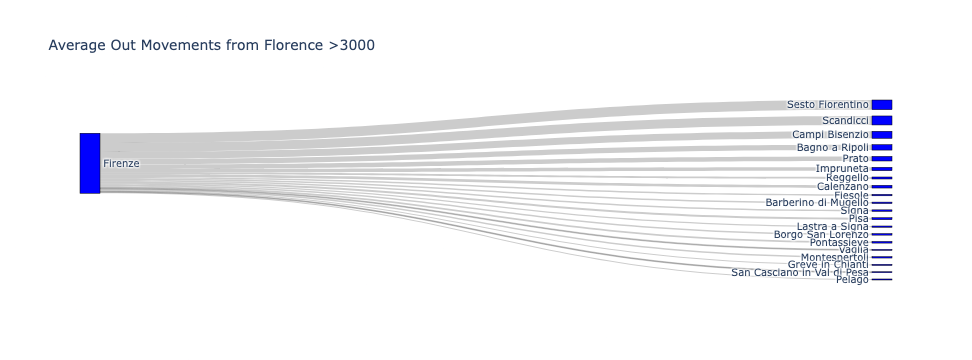

In [114]:
import plotly.graph_objects as go

df=Out_Florence_Fil


nodes = list(set(df['Start_Nome_Comune']).union(set(df['End_Nome_Comune'])))
node_indices = {node: idx for idx, node in enumerate(nodes)}


sources = df['Start_Nome_Comune'].map(node_indices)
targets = df['End_Nome_Comune'].map(node_indices)
values = df['Total_Out_Movement']


fig = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=nodes,
        color="blue"
    ),
    link=dict(
        source=sources,  
        target=targets,  
        value=values     
    )
)])

fig.update_layout(title_text="Average Out Movements from Florence >3000", font_size=10)
fig.show()

fig.write_html("sankey_diagram.html")

In [120]:
import pandas as pd
import holoviews as hv
import hvplot.pandas

hv.extension('bokeh')


df = Out_Florence_Pisa_Fil


nodes = pd.DataFrame({
    'name': pd.concat([df['Start_Nome_Comune'], df['End_Nome_Comune']]).unique()
})
nodes['index'] = nodes.index


nodes = hv.Dataset(nodes, kdims='index', vdims='name')


edges = df.copy()
edges['start_idx'] = edges['Start_Nome_Comune'].map(nodes.data.set_index('name')['index'])
edges['end_idx'] = edges['End_Nome_Comune'].map(nodes.data.set_index('name')['index'])


chord = hv.Chord((edges[['start_idx', 'end_idx', 'Total_Out_Movement']], nodes))


chord.opts(
    labels='name',                      
    edge_color='Total_Out_Movement',    
    node_color='name',                  
    cmap='Category20',                  
    edge_cmap='magma',                
    width=600,
    height=600,
    tools=['hover'],                    
    title='Out Movements from Florence and Pisa'
)


chord

hv.save(chord, 'chord_diagramFIPI.html', backend='bokeh')

In [ ]:
import pandas as pd
import holoviews as hv
import hvplot.pandas

hv.extension('bokeh')


df = Out_Florence_Fil


nodes = pd.DataFrame({
    'name': pd.concat([df['Start_Nome_Comune'], df['End_Nome_Comune']]).unique()
})
nodes['index'] = nodes.index


nodes = hv.Dataset(nodes, kdims='index', vdims='name')


edges = df.copy()
edges['start_idx'] = edges['Start_Nome_Comune'].map(nodes.data.set_index('name')['index'])
edges['end_idx'] = edges['End_Nome_Comune'].map(nodes.data.set_index('name')['index'])


chord = hv.Chord((edges[['start_idx', 'end_idx', 'Total_Out_Movement']], nodes))


chord.opts(
    labels='name',                      
    edge_color='Total_Out_Movement',    
    node_color='name',                  
    cmap='Category20',                  
    edge_cmap='magma',                
    width=600,
    height=600,
    tools=['hover'],                    
    title='Out Movements from Florence and Pisa'
)


chord

hv.save(chord, 'chord_diagram_FI.html', backend='bokeh')

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
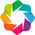

In [160]:
import holoviews as hv

hv.extension('bokeh')


df = Out_Florence_Pisa_Livorno_Fil


nodes = pd.DataFrame({'name': pd.concat([df['Start_Nome_Comune'], df['End_Nome_Comune']]).unique()})
nodes['index'] = nodes.index
nodes = hv.Dataset(nodes, kdims='index', vdims='name')


df['start_idx'] = df['Start_Nome_Comune'].map(nodes.data.set_index('name')['index'])
df['end_idx'] = df['End_Nome_Comune'].map(nodes.data.set_index('name')['index'])


chord = hv.Chord((df[['start_idx', 'end_idx', 'Total_Out_Movement']], nodes))


chord.opts(
    labels='name',                      
    edge_color='Total_Out_Movement',    
    node_color='name',                  
    cmap='Category20',                  
    edge_cmap='reds',                
    width=700,
    height=700,
    tools=['hover'],                    
    title='Out Movements from Florence, Pisa, and Livorno'
)


hv.save(chord, 'chord_diagram_FIPILI.html', backend='bokeh')

In [163]:
chord

:Chord   [start_idx,end_idx]   (Total_Out_Movement)

## Bar Charts Altair

In [122]:
intercomune_movements.head(1)

,StartId,EndId,PartOfWeek,Mot,tot,Start_Nome_Comune,Start_Nome_Provincia,Start_Geometry,End_Nome_Comune,End_Geometry,End_Nome_Provincia
1129,1,190,Mon-Fri,Road,7.52,Firenze,Firenze,"POLYGON ((681714.437 4849091.117, 681715.668 4...",Scandicci,"POLYGON ((672216.490 4850166.983, 672436.738 4...",Firenze


In [123]:
PartofWeek_movements= intercomune_movements.groupby('PartOfWeek').agg({'tot': 'sum'}).reset_index()

In [124]:
PartofWeek_movements

,PartOfWeek,tot
0,Mon-Fri,4636452.07
1,Saturday,3984325.28
2,Sunday,3450193.49


In [125]:
import altair as alt
data=PartofWeek_movements

chart = alt.Chart(data).mark_bar().encode(
    y=alt.Y('PartOfWeek:N', sort=['Mon-Fri', 'Saturday', 'Sunday']),  
    x=alt.X('tot:Q'), 
    color=alt.Color('tot:Q', scale=alt.Scale(scheme='reds'), title="Movement Intensity"),
    tooltip=[alt.Tooltip('tot:Q', title='Total Movement')]  
).properties(
    width=500,   
    height=300,
    title="Average daily Movements Totals by Part of Week"
)

chart.show()


alt.Chart(...)

In [126]:
Mot_movements= intercomune_movements.groupby('Mot').agg({'tot': 'sum'}).reset_index()
Mot_movements=Mot_movements[(Mot_movements['Mot']!='NotClassified') & (Mot_movements['Mot']!='Plane') & (Mot_movements['Mot'] != 'Tram')]

In [127]:
Mot_movements

,Mot,tot
0,Bus,1025675.50
2,Road,10344443.35
3,SlowModes,466122.20
4,Train,227305.91


In [128]:
print(Mot_movements['tot'].min(),Mot_movements['tot'].max())

227305.91 10344443.35


In [129]:
import altair as alt

data = Mot_movements

chart = alt.Chart(data).mark_bar().encode(
    y=alt.Y('Mot:N',sort='-x'),  
    x=alt.X('tot:Q'), 
    color=alt.Color('tot:Q', scale=alt.Scale(scheme='reds'), title="Movement Intensity"),
    tooltip=[alt.Tooltip('tot:Q', title='Total Movement')]  
).properties(
    width=500,   
    height=300,
    title="Movements by Means of Transport"
)

chart.show()
chart.save('movements_by_MOT.html')

alt.Chart(...)

In [130]:
Mot_movements= intercomune_movements.groupby(['Mot']).agg({'tot': 'sum'}).reset_index()

In [131]:
Mot_movements

,Mot,tot
0,Bus,1025675.50
1,Plane,26.81
2,Road,10344443.35
3,SlowModes,466122.20
4,Train,227305.91
5,Tram,7397.07


In [132]:
Mot_movements= intercomune_movements.groupby(['Mot','PartOfWeek']).agg({'tot': 'sum'}).reset_index()

In [133]:
Mot_movements=Mot_movements[(Mot_movements['Mot']!='NotClassified') & (Mot_movements['Mot']!='Plane')]

In [134]:
data=Mot_movements

In [135]:
chart = alt.Chart(data).mark_bar().encode(
    x=alt.X('PartOfWeek:N', title="Part of the Week", sort=['Mon-Fri', 'Saturday', 'Sunday']),
    y=alt.Y('tot:Q', title="Total Movements"),
    color=alt.Color('Mot:N', title="Mode of Transport"),
    column=alt.Column('Mot:N', title="Mode of Transport"),
    tooltip=[alt.Tooltip('tot:Q', title='Total Movement')]
).properties(
    width=100,
    height=300,
    title="Movement Totals by Mode of Transport and Part of the Week"
).configure_axis(
    labelFontSize=10,
    titleFontSize=12
)

chart

alt.Chart(...)

## Bar Charts of Origin Municipality

In [ ]:
StartComune_movements= intercomune_movements.groupby('Start_Nome_Comune').agg({'tot': 'sum'}).reset_index()

In [ ]:
StartComune_movements

In [ ]:
top_data = StartComune_movements.nlargest(20, 'tot')


chart = alt.Chart(top_data).mark_bar().encode(
    x=alt.X('tot:Q', title="Total Movement"),
    y=alt.Y('Start_Nome_Comune:N', sort='-x', title="Starting Location"),  # Sort by total movements in descending order
    tooltip=[alt.Tooltip('tot:Q', title='Total Movement')]
).properties(
    width=600,
    height=400,
    title="Top 10 Starting Locations by Total Movement"
)

chart.show()


In [ ]:
StartComune_movements

In [ ]:
StartComune_movements=intercomune_movements.groupby(by=['Start_Nome_Comune','Mot']).agg({'tot': 'sum'}).reset_index()

In [ ]:
StartComune_movements=StartComune_movements[StartComune_movements['Mot']!='Plane']

In [ ]:
data = StartComune_movements.groupby('Start_Nome_Comune', as_index=False)['tot'].sum()


data = data.sort_values(by='tot', ascending=False).head(20)

data = StartComune_movements[StartComune_movements['Start_Nome_Comune'].isin(data['Start_Nome_Comune'])]
chart = alt.Chart(data).mark_bar().encode(
    x=alt.X('sum(tot):Q', title="Total Movement"),
    y=alt.Y('Start_Nome_Comune:N', sort='-x', title="Origin"),
    color=alt.Color('Mot:N', title="Mode of Transport"),
    order=alt.Order('tot:Q', sort='descending'),
    tooltip=[alt.Tooltip('sum(tot):Q', title='Total Movement'), alt.Tooltip('Mot:N', title="Mode of Transport")]
).properties(
    width=600,
    height=800,
    title="Movement Totals by Origing and Mode of Transport"
)

chart.show()

## Bar Charts of Destination Municipality

In [ ]:
EndComune_movements= intercomune_movements.groupby('End_Nome_Comune').agg({'tot': 'sum'}).reset_index()

In [ ]:
top_data = EndComune_movements.nlargest(20, 'tot')


chart = alt.Chart(top_data).mark_bar().encode(
    x=alt.X('tot:Q', title="Total Movement"),
    y=alt.Y('End_Nome_Comune:N', sort='-x', title="Ending Location"),  # Sort by total movements in descending order
    tooltip=[alt.Tooltip('tot:Q', title='Total Movement')]
).properties(
    width=600,
    height=400,
    title="Top 10 Ending Locations by Total Movement"
)

chart.show()



In [ ]:
EndComune_movements=intercomune_movements.groupby(by=['End_Nome_Comune','Mot']).agg({'tot': 'sum'}).reset_index()

In [ ]:
EndComune_movements=EndComune_movements[(EndComune_movements['Mot']!='Plane')&(EndComune_movements['Mot']!='NotClassified')]

In [ ]:
EndComune_movements

In [ ]:
import altair as alt



data = EndComune_movements.groupby('End_Nome_Comune', as_index=False)['tot'].sum()


data = data.sort_values(by='tot', ascending=False).head(20)

data = EndComune_movements[EndComune_movements['End_Nome_Comune'].isin(data['End_Nome_Comune'])]
chart = alt.Chart(data).mark_bar().encode(
    x=alt.X('sum(tot):Q', title="Total Movement"),
    y=alt.Y('End_Nome_Comune:N', sort='-x', title="Destination"),
    color=alt.Color('Mot:N', title="Mode of Transport"),
    order=alt.Order('tot:Q', sort='descending'),
    tooltip=[alt.Tooltip('sum(tot):Q', title='Total Movement'), alt.Tooltip('Mot:N', title="Mode of Transport")]
).properties(
    width=600,
    height=800,
    title="Movement Totals by Destination and Mode of Transport"
)

chart.show()

## Bar chart of Percentage of Mot usage

In [153]:
EndComune_movements= intercomune_movements.groupby(by=['End_Nome_Comune','Mot']).agg({'tot': 'sum'}).reset_index()

In [154]:
EndComune_movements=EndComune_movements[(EndComune_movements['Mot']!='Plane')&(EndComune_movements['Mot']!='NotClassified')]

In [155]:
total_movements = EndComune_movements.groupby('End_Nome_Comune')['tot'].transform('sum')
total_movements

0       14074.52
1       14074.52
2       14074.52
3       14074.52
4        1987.78
          ...   
1108    39293.98
1109     1280.65
1110     1280.65
1111     1280.65
1112     1280.65
Name: tot, Length: 1096, dtype: float64

In [156]:
EndComune_movements['percent'] = (EndComune_movements['tot'] / total_movements) * 100

In [157]:
EndComune_movements

,End_Nome_Comune,Mot,tot,percent
0,Abbadia San Salvatore,Bus,711.93,5.058290
1,Abbadia San Salvatore,Road,13041.44,92.659927
2,Abbadia San Salvatore,SlowModes,316.82,2.251018
3,Abbadia San Salvatore,Train,4.33,0.030765
4,Abetone Cutigliano,Bus,99.37,4.999044
...,...,...,...,...
1108,Volterra,Train,69.08,0.175803
1109,Zeri,Bus,43.98,3.434194
1110,Zeri,Road,1167.50,91.164643
1111,Zeri,SlowModes,64.76,5.056807


In [158]:
top_destinations = EndComune_movements.groupby('End_Nome_Comune', as_index=False)['tot'].sum()
top_destinations = top_destinations.sort_values(by='tot', ascending=False).head(10)
top_destination_list = top_destinations['End_Nome_Comune'].tolist()

In [159]:
data = EndComune_movements[EndComune_movements['End_Nome_Comune'].isin(top_destination_list)]


chart = alt.Chart(data).mark_bar().encode(
    x=alt.X('percent:Q', title="% Movements"),
    y=alt.Y('End_Nome_Comune:N', sort=top_destination_list, title="Destination"),
    color=alt.Color('Mot:N', title="Mode of Transport"),
    order=alt.Order('percent:Q', sort='descending'),
    tooltip=[alt.Tooltip('percent:Q', title="% Movements"), alt.Tooltip('Mot:N', title="Mode of Transport")]
).properties(
    width=600,
    height=800,
    title="Percentage of Movements by Destination and Mode of Transport"
)

chart.show()
chart.save('Mot%_Top10Municipalities.html')

alt.Chart(...)

## Road Usage

In [ ]:
EndComune_movementsRoad=EndComune_movements[EndComune_movements['Mot']=='Road']

In [ ]:
EndComune_movementsRoad
top_destinations = EndComune_movementsRoad.sort_values(by='percent', ascending=False).head(20)

In [ ]:
top_destinations

In [ ]:

top_destination_list = top_destinations['End_Nome_Comune'].tolist()

data = EndComune_movements[EndComune_movements['End_Nome_Comune'].isin(top_destination_list)]
data['End_Nome_Comune'] = pd.Categorical(data['End_Nome_Comune'], categories=top_destination_list, ordered=True)

chart = alt.Chart(data).mark_bar().encode(
    x=alt.X('percent:Q', title="% Movements"),
    y=alt.Y('End_Nome_Comune:N', sort=top_destination_list, title="Destination"),
    color=alt.Color('Mot:N', title="Mode of Transport"),
    tooltip=[alt.Tooltip('percent:Q', title="% Movements", format=".2f"), alt.Tooltip('Mot:N', title="Mode of Transport")]
).properties(
    width=600,
    height=800,
    title="Percentage of Movements by Destination and Mode of Transport"
)

chart.show()


In [ ]:
EndComune_movementsRoad.sort_values(by='percent', ascending=True)

In [ ]:
EndComune_movementsRoad_gdf = EndComune_movementsRoad.merge(tessellation, left_on='End_Nome_Comune', right_on='Nome_Comune', how='inner')
EndComune_movementsRoad_gdf = gpd.GeoDataFrame(
    EndComune_movementsRoad_gdf, 
    geometry='geometry' 
)

In [ ]:
EndComune_movementsRoad_gdf.head(1)

In [ ]:

print(EndComune_movementsRoad_gdf.is_valid.all())  


print(EndComune_movementsRoad_gdf.geometry.geom_type.value_counts())


In [ ]:
EndComune_movementsRoad_gdf = EndComune_movementsRoad_gdf.set_crs(epsg=4326)


In [ ]:
print(EndComune_movementsRoad_gdf.crs)  

In [ ]:
import folium
import branca.colormap as cm


latitude = 43.7696
longitude = 11.2558

map_f = folium.Map(location=[latitude, longitude], zoom_start=8, tiles='CartoDB positron')


colormap = cm.LinearColormap(
    colors=['lightblue', 'yellow', 'orange', 'red'],
    vmin=EndComune_movementsRoad_gdf['percent'].min(),
    vmax=EndComune_movementsRoad_gdf['percent'].max()
)


colormap.caption = "Road Usage"
colormap.add_to(map_f)


def movement_style_function(feature):
    out_movement = feature['properties']['percent']
    color = colormap(out_movement)
    return {
        'fillColor': color,
        'color': 'gray',
        'weight': 0.5,
        'fillOpacity': 0.6,
    }


def region_style_function(feature):
    if feature['properties']['Nome_Regione'] == 'Toscana':
        return {
            'fillColor': 'green',
            'color': 'green',
            'weight': 0.5,
            'fillOpacity': 0.1,
        }
    else:
        return {
            'fillColor': 'blue',
            'color': 'blue',
            'weight': 1,
            'fillOpacity': 0.1,
        }


folium.GeoJson(
    tessellation,
    style_function=region_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['NAME', 'Nome_Provincia'],
        aliases=['Name:', 'Province:'],
        localize=True
    )
).add_to(map_f)

id
folium.GeoJson(
    EndComune_movementsRoad_gdf,
    style_function=movement_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Nome_Comune', 'percent'],
        aliases=['Comune:', '% road'],
        localize=True
    )
).add_to(map_f)

map_f


## Buses

In [ ]:
EndComune_movementsBus=EndComune_movements[EndComune_movements['Mot']=='Bus']

In [ ]:

top_destinations = EndComune_movementsBus.sort_values(by='percent', ascending=False).head(20)

In [ ]:
top_destinations

In [ ]:
EndComune_movementsBus.sort_values(by='percent', ascending=True)

In [ ]:
EndComune_movementsBus_gdf = EndComune_movementsBus.merge(tessellation, left_on='End_Nome_Comune', right_on='Nome_Comune', how='inner')


In [ ]:
EndComune_movementsBus_gdf.head()

In [ ]:
EndComune_movementsBus_gdf= gpd.GeoDataFrame(
    EndComune_movementsBus_gdf,  
    geometry=EndComune_movementsBus_gdf["geometry"]  
)


In [ ]:
EndComune_movementsBus_gdf = EndComune_movementsBus_gdf.set_crs(epsg=4326)


In [ ]:
print(EndComune_movementsBus_gdf.crs)  

In [ ]:
import folium
import branca.colormap as cm


latitude = 43.7696
longitude = 11.2558

map_f = folium.Map(location=[latitude, longitude], zoom_start=8, tiles='CartoDB positron')


colormap = cm.LinearColormap(
    colors=['lightblue', 'yellow', 'orange', 'red'],
    vmin=EndComune_movementsBus_gdf['percent'].min(),
    vmax=EndComune_movementsBus_gdf['percent'].max()
)


colormap.caption = "Bus Usage"
colormap.add_to(map_f)


def movement_style_function(feature):
    out_movement = feature['properties']['percent']
    color = colormap(out_movement)
    return {
        'fillColor': color,
        'color': 'gray',
        'weight': 0.5,
        'fillOpacity': 0.6,
    }


def region_style_function(feature):
    if feature['properties']['Nome_Regione'] == 'Toscana':
        return {
            'fillColor': 'green',
            'color': 'green',
            'weight': 0.5,
            'fillOpacity': 0.1,
        }
    else:
        return {
            'fillColor': 'blue',
            'color': 'blue',
            'weight': 1,
            'fillOpacity': 0.1,
        }


folium.GeoJson(
    tessellation,
    style_function=region_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['NAME', 'Nome_Provincia'],
        aliases=['Name:', 'Province:'],
        localize=True
    )
).add_to(map_f)

id
folium.GeoJson(
    EndComune_movementsBus_gdf,
    style_function=movement_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Nome_Comune', 'percent'],
        aliases=['Comune:', '% Bus'],
        localize=True
    )
).add_to(map_f)
map_f.save("bus_usage_map.html")

map_f


## Trains


In [136]:
EndComune_movements= intercomune_movements.groupby(by=['End_Nome_Comune','Mot']).agg({'tot': 'sum'}).reset_index()

In [137]:
EndComune_movements=EndComune_movements[(EndComune_movements['Mot']!='Plane')&(EndComune_movements['Mot']!='NotClassified')]

In [138]:
total_movements = EndComune_movements.groupby('End_Nome_Comune')['tot'].transform('sum')
total_movements

0       14074.52
1       14074.52
2       14074.52
3       14074.52
4        1987.78
          ...   
1108    39293.98
1109     1280.65
1110     1280.65
1111     1280.65
1112     1280.65
Name: tot, Length: 1096, dtype: float64

In [139]:
EndComune_movements['percent'] = (EndComune_movements['tot'] / total_movements) * 100

In [140]:
EndComune_movementsTrain=EndComune_movements[EndComune_movements['Mot']=='Train']

In [141]:
tessellation=gpd.read_file("/Users/Andre/Desktop/Internship/TessellationToscana.geojson")

In [142]:
EndComune_movementsTrain_gdf = EndComune_movementsTrain.merge(tessellation, left_on='End_Nome_Comune', right_on='Nome_Comune', how='inner')

In [143]:
EndComune_movementsTrain_gdf= gpd.GeoDataFrame(
    EndComune_movementsTrain_gdf,  
    geometry=EndComune_movementsTrain_gdf["geometry"]  
)

In [144]:
EndComune_movementsTrain_gdf = EndComune_movementsTrain_gdf.set_crs(epsg=4326)


In [145]:
import folium
import branca.colormap as cm


latitude = 43.7696
longitude = 11.2558

map_f = folium.Map(location=[latitude, longitude], zoom_start=8, tiles='CartoDB positron')


colormap = cm.LinearColormap(
    colors=['lightblue', 'yellow', 'orange', 'red'],
    vmin=EndComune_movementsTrain_gdf['percent'].min(),
    vmax=EndComune_movementsTrain_gdf['percent'].max()
)


colormap.caption = "Train Usage"
colormap.add_to(map_f)


def movement_style_function(feature):
    out_movement = feature['properties']['percent']
    color = colormap(out_movement)
    return {
        'fillColor': color,
        'color': 'gray',
        'weight': 0.5,
        'fillOpacity': 0.6,
    }


def region_style_function(feature):
    if feature['properties']['Nome_Regione'] == 'Toscana':
        return {
            'fillColor': 'green',
            'color': 'green',
            'weight': 0.5,
            'fillOpacity': 0.1,
        }
    else:
        return {
            'fillColor': 'blue',
            'color': 'blue',
            'weight': 1,
            'fillOpacity': 0.1,
        }


folium.GeoJson(
    tessellation,
    style_function=region_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['NAME', 'Nome_Provincia'],
        aliases=['Name:', 'Province:'],
        localize=True
    )
).add_to(map_f)

id
folium.GeoJson(
    EndComune_movementsTrain_gdf,
    style_function=movement_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Nome_Comune', 'percent'],
        aliases=['Comune:', '% Train'],
        localize=True
    )
).add_to(map_f)

map_f.save('TrainUsage.html')


In [146]:
LineeFerr_gdf = gpd.read_file("internship/ferrovie/Ferrovie.shp")

In [147]:
TutteStazioni=gpd.read_file("internship/ferrovie/TutteStazioni.shp")

In [148]:
TutteStazioni.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 258 entries, 0 to 257
Data columns (total 19 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   pk_uid     258 non-null    int64   
 1   cod_stz    258 non-null    object  
 2   den_uff    258 non-null    object  
 3   cod_gnz    258 non-null    object  
 4   x_stz      258 non-null    float64 
 5   y_stz      258 non-null    float64 
 6   tip_gnz    258 non-null    object  
 7   gnz        258 non-null    object  
 8   org        258 non-null    object  
 9   origine    258 non-null    object  
 10  indirizzo  253 non-null    object  
 11  comune     258 non-null    object  
 12  provincia  258 non-null    object  
 13  gestore    204 non-null    object  
 14  categoria  181 non-null    object  
 15  cod_sta    258 non-null    object  
 16  data_agg   258 non-null    object  
 17  data_elab  258 non-null    object  
 18  geometry   258 non-null    geometry
dtypes: float64(2), geomet

In [149]:
TutteStazioni['gestore'].unique()

array(['RFI', None, 'TFT', 'Centostazioni', 'GrandiStazioni'],
      dtype=object)

In [150]:
TutteStazioni.loc[TutteStazioni['gestore'] == 'TFT', 'categoria'] = 'bronze'

In [151]:
TutteStazioni=TutteStazioni.to_crs(epsg=4326)
LineeFerr_gdf=LineeFerr_gdf.to_crs(epsg=4326)

In [152]:
import folium
import branca.colormap as cm

latitude = 43.7696
longitude = 11.2558
map_f = folium.Map(location=[latitude, longitude], zoom_start=8, tiles='CartoDB positron')

#Tessellazione 
def style_function(feature):
        return {
            'fillColor': 'green',
            'color': 'green',
            'weight': 0.5,
            'fillOpacity': 0.1,
        }
folium.GeoJson(
    tessellation,
    style_function=style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['NAME', 'Nome_Provincia'],
        aliases=['Name:', 'Province:'],
        localize=True
    )
).add_to(map_f)

#Movimenti in Treno
colormap = cm.LinearColormap(
    colors=['lightblue', 'yellow', 'orange', 'red'],
    vmin=EndComune_movementsTrain_gdf['percent'].min(),
    vmax=EndComune_movementsTrain_gdf['percent'].max()
)

colormap.caption = "Train Usage in % of Total Movements"
colormap.add_to(map_f)

def movement_style_function(feature):
    out_movement = feature['properties']['percent']
    color = colormap(out_movement)
    return {
        'fillColor': color,
        'color': 'gray',
        'weight': 0.5,
        'fillOpacity': 0.6,
    }
    
folium.GeoJson(
    EndComune_movementsTrain_gdf,
    style_function=movement_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Nome_Comune', 'percent'],
        aliases=['Comune:', '% Train'],
        localize=True
    )
).add_to(map_f)

#Linee Ferroviarie 
folium.GeoJson(
    LineeFerr_gdf,
    tooltip=folium.GeoJsonTooltip(
        fields=['pk_uid', 'den_uff'],
        aliases=['ID:', 'Type:']
    ),
    style_function=lambda x: {
        'weight': 1.5, 
        'color': 'black',  
        'opacity': 0.7  
    }
).add_to(map_f)

#Stazioni
TutteStazioni_fil = TutteStazioni[
    TutteStazioni['categoria'].isin(['bronze', 'silver', 'gold', 'platinum'])
].sort_values(by='categoria', key=lambda x: x.map({'bronze': 0, 'silver': 1, 'gold': 2, 'platinum': 3}))
def get_color(category):
    color_map = {
        'bronze': 'brown',
        'silver': 'gray',
        'gold': 'lime',
        'platinum': 'white',
    }
    return color_map.get(category.lower()) 
    
for idx, row in TutteStazioni_fil.iterrows():
    lat = row.geometry.y
    lon = row.geometry.x
    Name= row.den_uff.capitalize()
    category=row.categoria
    color = get_color(category)
    if not color:
        continue

    tooltip= f"Stazione: {Name}   Categoria: {category}"

    folium.CircleMarker(
        location=[lat, lon],  
        radius=2.5,
        opacity=0.6,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=1,
        tooltip=tooltip
    ).add_to(map_f)


map_f.save("Stazioni+Ferrovie.html")


map_f


## Slow Movements

In [ ]:
EndComune_movementsSlow=EndComune_movements[EndComune_movements['Mot']=='SlowModes']

In [ ]:
top_destinations = EndComune_movementsSlow.sort_values(by='percent', ascending=False).head(20)

In [ ]:
top_destinations

In [ ]:
EndComune_movementsSlow.sort_values(by='percent', ascending=True)

In [ ]:
EndComune_movementsSlow_gdf = EndComune_movementsSlow.merge(tessellation, left_on='End_Nome_Comune', right_on='Nome_Comune', how='inner')


In [ ]:
EndComune_movementsSlow_gdf.head()

In [ ]:
EndComune_movementsSlow_gdf= gpd.GeoDataFrame(
    EndComune_movementsSlow_gdf,  
    geometry=EndComune_movementsSlow_gdf["geometry"]  
)


In [ ]:
EndComune_movementsSlow_gdf = EndComune_movementsSlow_gdf.set_crs(epsg=4326)


In [ ]:
print(EndComune_movementsSlow_gdf.crs)  

In [ ]:
import folium
import branca.colormap as cm


latitude = 43.7696
longitude = 11.2558

map_f = folium.Map(location=[latitude, longitude], zoom_start=8, tiles='CartoDB positron')


colormap = cm.LinearColormap(
    colors=['lightblue', 'yellow', 'orange', 'red'],
    vmin=EndComune_movementsSlow_gdf['percent'].min(),
    vmax=EndComune_movementsSlow_gdf['percent'].max()
)


colormap.caption = "SlowModes Usage"
colormap.add_to(map_f)


def movement_style_function(feature):
    out_movement = feature['properties']['percent']
    color = colormap(out_movement)
    return {
        'fillColor': color,
        'color': 'gray',
        'weight': 0.5,
        'fillOpacity': 0.6,
    }


def region_style_function(feature):
    if feature['properties']['Nome_Regione'] == 'Toscana':
        return {
            'fillColor': 'green',
            'color': 'green',
            'weight': 0.5,
            'fillOpacity': 0.1,
        }
    else:
        return {
            'fillColor': 'blue',
            'color': 'blue',
            'weight': 1,
            'fillOpacity': 0.1,
        }


folium.GeoJson(
    tessellation,
    style_function=region_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['NAME', 'Nome_Provincia'],
        aliases=['Name:', 'Province:'],
        localize=True
    )
).add_to(map_f)

id
folium.GeoJson(
    EndComune_movementsSlow_gdf,
    style_function=movement_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Nome_Comune', 'percent'],
        aliases=['Comune:', '% SlowModes'],
        localize=True
    )
).add_to(map_f)

map_f


## Trams

In [ ]:
EndComune_movements['Mot'].unique()

In [ ]:
def filter_Mot(gdf,Mot):
    gdf=gdf[gdf['Mot']==Mot]
    gdf = gdf.merge(tessellation, left_on='End_Nome_Comune', right_on='Nome_Comune', how='inner')
    gdf= gpd.GeoDataFrame(gdf, geometry=gdf["geometry"])
    gdf = gdf.set_crs(epsg=4326)
    return gdf


In [ ]:
data=filter_Mot(EndComune_movements,'Tram')

In [ ]:
import folium
import branca.colormap as cm

latitude = 43.7696
longitude = 11.2558

map_f = folium.Map(location=[latitude, longitude], zoom_start=8, tiles='CartoDB positron')


colormap = cm.LinearColormap(
    colors=['lightblue', 'yellow', 'orange', 'red'],
    vmin=data['percent'].min(),
    vmax=data['percent'].max()
)

colormap.caption = "Tram Usage"
colormap.add_to(map_f)

def movement_style_function(feature):
    out_movement = feature['properties']['percent']
    color = colormap(out_movement)
    return {
        'fillColor': color,
        'color': 'gray',
        'weight': 0.5,
        'fillOpacity': 0.6,
    }

def region_style_function(feature):
    if feature['properties']['Nome_Regione'] == 'Toscana':
        return {
            'fillColor': 'green',
            'color': 'green',
            'weight': 0.5,
            'fillOpacity': 0.1,
        }
    else:
        return {
            'fillColor': 'blue',
            'color': 'blue',
            'weight': 1,
            'fillOpacity': 0.1,
        }

folium.GeoJson(
    tessellation,
    style_function=region_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['NAME', 'Nome_Provincia'],
        aliases=['Name:', 'Province:'],
        localize=True
    )
).add_to(map_f)

id
folium.GeoJson(
    data,
    style_function=movement_style_function,
    tooltip=folium.GeoJsonTooltip(
        fields=['Nome_Comune', 'percent'],
        aliases=['Comune:', '% Tram'],
        localize=True
    )
).add_to(map_f)

map_f